In [2]:
import pandas as pd

# Load the dataset to inspect the initial structure and data types
data = pd.read_csv('Traffic_Volume.csv')

# Display the first few rows of the dataset to understand its structure
data_preview = data.head()

# Show the dimensions of the dataset and data types of each column
data_dimensions = data.shape
data_types = data.dtypes

data_preview, data_dimensions, data_types


(   OBJECTID  LINKID               DATA_DATE            ROUTE_COMMON_NAME  \
 0         1  795997  2011/06/07 04:00:00+00  SC-1538E (Frederick County)   
 1         2  709217  2019/12/10 05:00:00+00   SC-1132E (Campbell County)   
 2         3  720637  2021/11/29 05:00:00+00   SC-651N (Dickenson County)   
 3         4  755648  2020/07/30 04:00:00+00      SC-640N (Nelson County)   
 4         5  776797  2017/07/07 04:00:00+00  SC-746N (Washington County)   
 
          ROUTE_NAME        HTRIS_ID ROUTE_ALIAS                  START_LABEL  \
 0  R-VA034SC01538EB    3401538                    34-781 Prince Frederick Dr   
 1  R-VA015SC01132EB    1501132                   0.08 ME SR 40 Wickliffe Ave   
 2  R-VA025SC00651NB    2500651                            25-855 Highland Rd   
 3  R-VA062SC00640NB    6200640                                2.00 MN 62-641   
 4  R-VA095SC00746NB    9500746                         95-700 Rich Valley Rd   
 
                      END_LABEL    ADT  ... EVEN

### data cleaning

In [3]:
# Data Cleaning Process

# Step 1: Handle missing values
missing_values_count = data.isnull().sum()

# Display the columns with missing values and the count of missing values
missing_values_details = missing_values_count[missing_values_count > 0]

# Step 2: Identify columns with a high percentage of missing values (threshold: more than 50% missing)
high_missing_data_columns = missing_values_details[missing_values_details > (data.shape[0] * 0.5)]

# For demonstration, we'll remove columns with high missing values and fill other missing values with median for numerical
# and mode for categorical columns
data_clean = data.drop(columns=high_missing_data_columns.index, errors='ignore')

# Impute remaining missing values for numerical columns with median
numerical_columns = data_clean.select_dtypes(include=['float64', 'int64']).columns
data_clean[numerical_columns] = data_clean[numerical_columns].fillna(data_clean[numerical_columns].median())

# Impute remaining missing values for categorical columns with mode (most frequent value)
categorical_columns = data_clean.select_dtypes(include=['object']).columns
for col in categorical_columns:
    mode_value = data_clean[col].mode()[0]
    data_clean[col] = data_clean[col].fillna(mode_value)

# Step 3: Detect and remove outliers for numerical columns using IQR method
Q1 = data_clean[numerical_columns].quantile(0.25)
Q3 = data_clean[numerical_columns].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out the outliers
data_clean = data_clean[~((data_clean[numerical_columns] < lower_bound) | (data_clean[numerical_columns] > upper_bound)).any(axis=1)]

# Re-check for missing values post cleaning
post_clean_missing_values_count = data_clean.isnull().sum()
remaining_missing = post_clean_missing_values_count[post_clean_missing_values_count > 0]

missing_values_details, high_missing_data_columns, remaining_missing


(HTRIS_ID                           745
 ADT                                  3
 PERCENT_4_TIRE                   94712
 PERCENT_BUS                      94712
 PERCENT_TRUCK_2_AXLE             94712
 PERCENT_TRUCK_3_AXLE             94712
 PERCENT_TRUCK_1_TRAIL            94712
 PERCENT_TRUCK_2_TRAIL            94712
 K_FACTOR                         92351
 K_FACTOR_QUALITY_CODE               63
 DIRECTION_FACTOR                 92371
 AAWDT                            91950
 AAWDT_QUALITY_CODE                   6
 LOC_COMP_DIRECTIONALITY_NAME       196
 FROM_JURISDICTION                   19
 TO_JURISDICTION                     13
 PEAK_SINGLE_UNIT_TRUCK           95865
 PEAK_COMBINATION_TRUCK           95865
 MAXIMUMSCALEDENOMINATOR              9
 FROM_DISTRICT                      431
 TO_DISTRICT                        544
 DATA_CUSTODIAN_EMAIL            121679
 METADATA_URL                    121679
 Shape__Length                      139
 dtype: int64,
 PERCENT_4_TIRE          

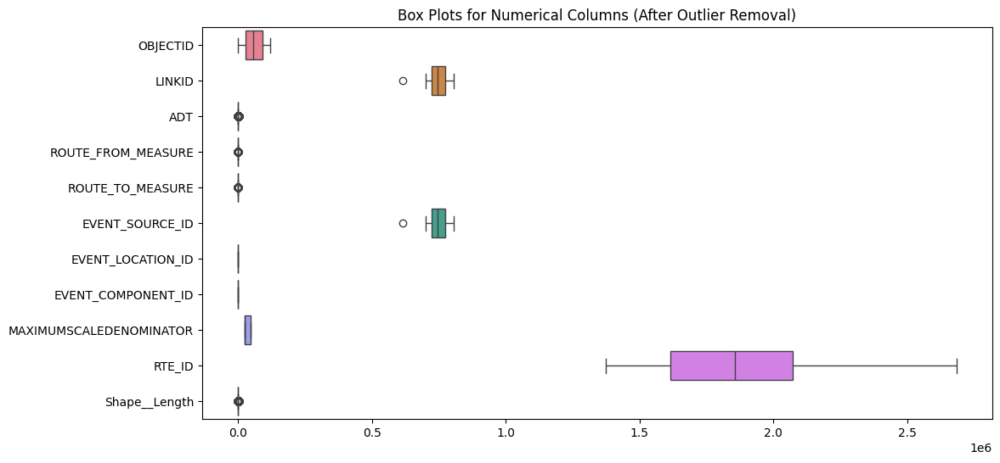

In [4]:
## outlier plots
import matplotlib.pyplot as plt
import seaborn as sns

# Create box plots for numerical columns to visualize outliers
plt.figure(figsize=(12, 6))
sns.boxplot(data=data_clean[numerical_columns], orient="h")
plt.title("Box Plots for Numerical Columns (After Outlier Removal)")    
plt.show()


In [5]:
## save cleaned data
data_clean.to_csv('Traffic_Volume_Cleaned.csv', index=False)

# EDA

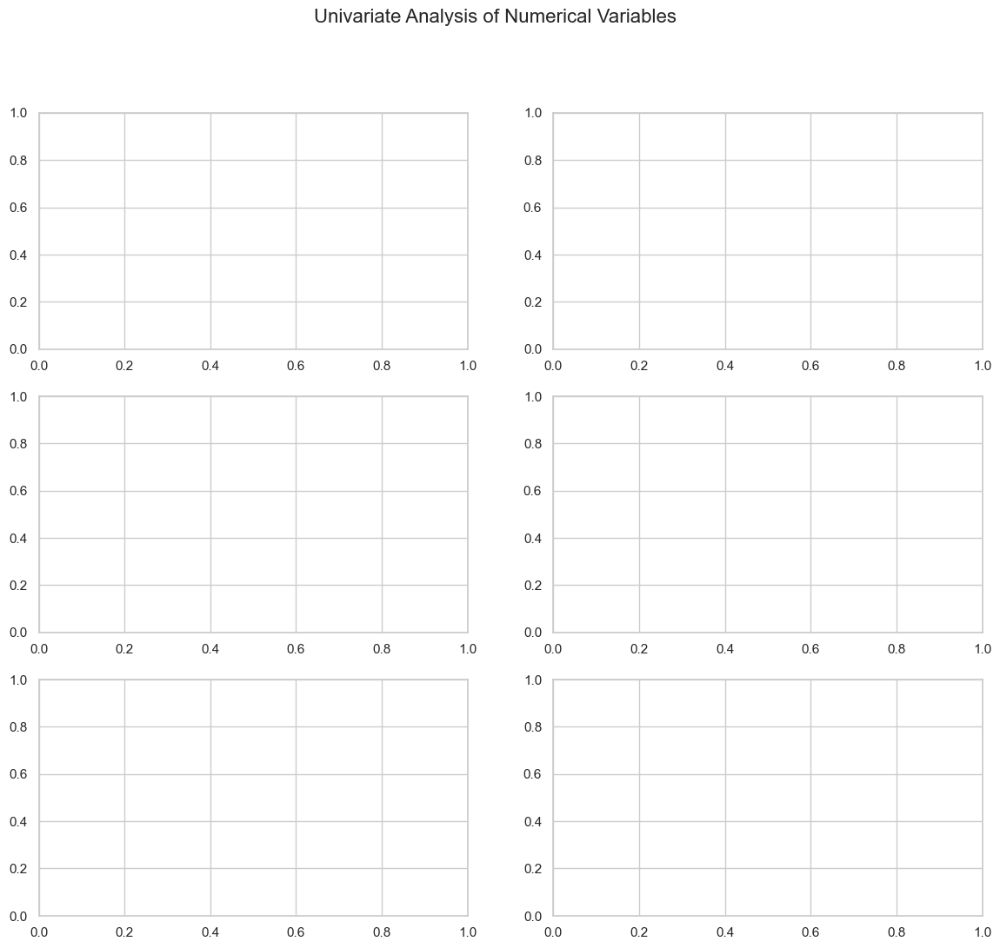

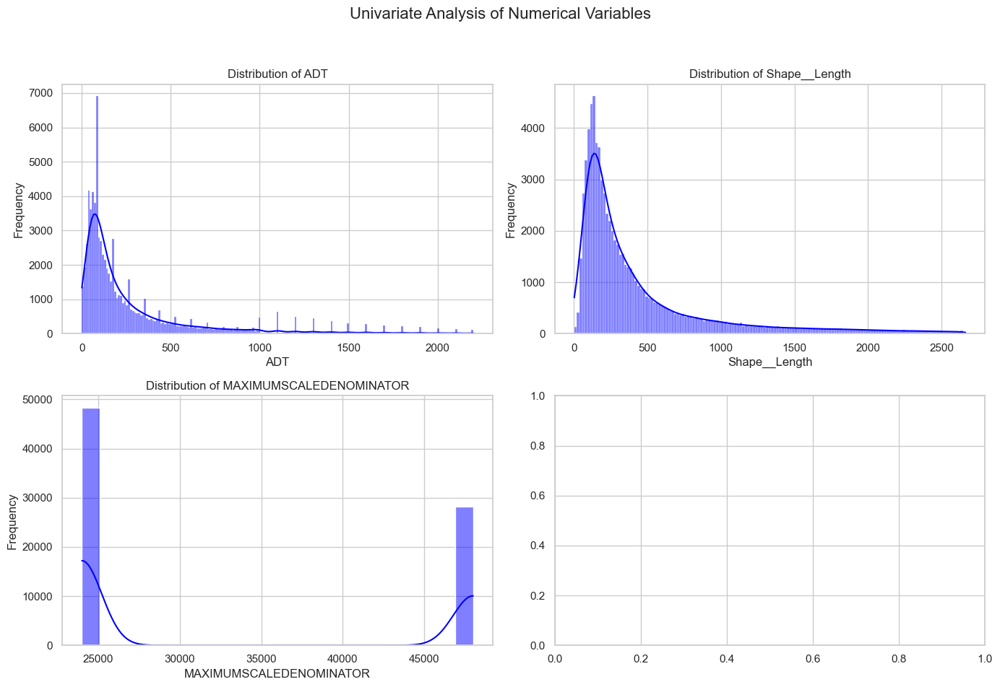

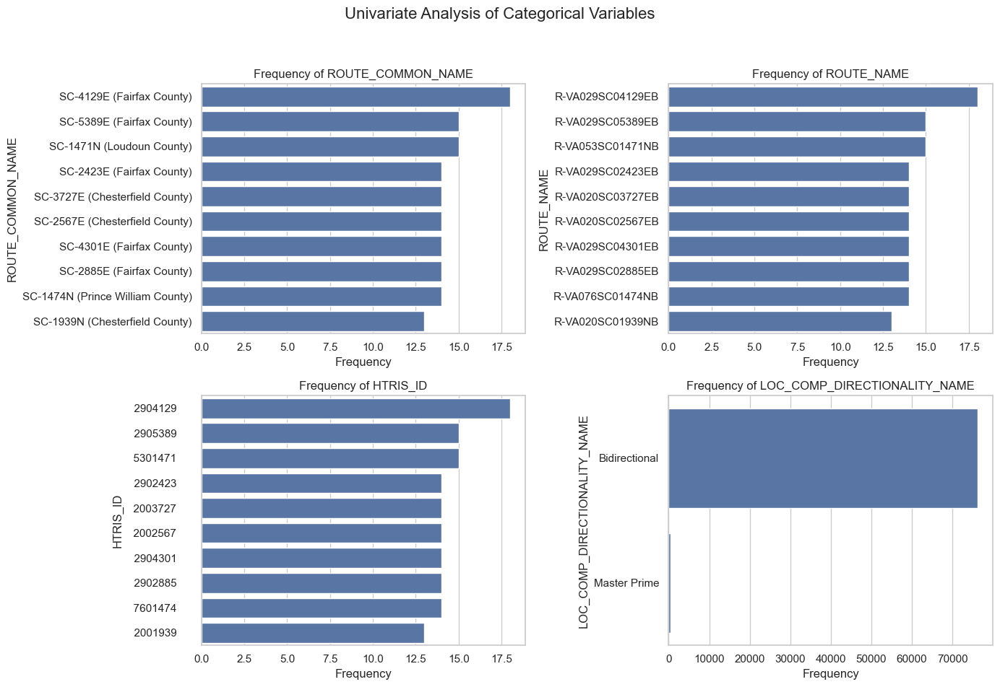

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the aesthetics for plots
sns.set(style="whitegrid")

# 1. Univariate Analysis
# a. Numerical Variables: Histograms for distribution
fig, axes = plt.subplots(3, 2, figsize=(14, 12))
fig.suptitle('Univariate Analysis of Numerical Variables', fontsize=16)

# List of numerical columns for histogram
# Adjusting the numerical columns list after the removal of some columns during the cleaning process
available_numerical_cols = [col for col in numerical_cols_hist if col in data_clean.columns]

# Redoing the univariate analysis with the adjusted list of numerical columns
fig, axes = plt.subplots(2, 2, figsize=(14, 10))  # Adjusting subplot grid to fit the available columns
fig.suptitle('Univariate Analysis of Numerical Variables', fontsize=16)

for col, ax in zip(available_numerical_cols, axes.flatten()):
    sns.histplot(data_clean[col], kde=True, color='blue', ax=ax)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


# b. Categorical Variables: Bar charts for frequency distribution
categorical_cols = ['ROUTE_COMMON_NAME', 'ROUTE_NAME', 'HTRIS_ID', 'LOC_COMP_DIRECTIONALITY_NAME']

fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Univariate Analysis of Categorical Variables', fontsize=16)

for col, ax in zip(categorical_cols, axes.flatten()):
    sns.countplot(y=data_clean[col], order=data_clean[col].value_counts().index[:10], ax=ax)
    ax.set_title(f'Frequency of {col}')
    ax.set_xlabel('Frequency')
    ax.set_ylabel(col)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])

# Output the plots to the user
plt.show()


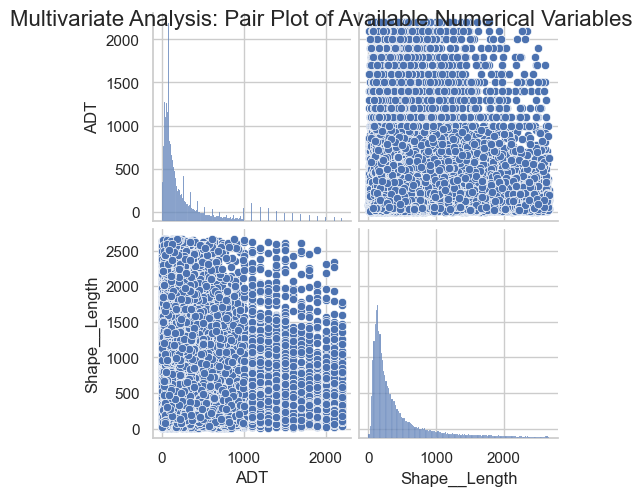

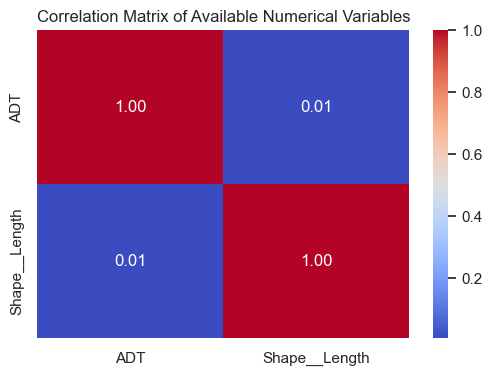

In [10]:
# Bivariate and Multivariate Analysis

# Adjusting the selection of numerical columns after confirming their availability in the cleaned data
available_numerical_cols = ['ADT', 'Shape__Length']  # Restrict to columns confirmed to exist post-cleaning

# Pair plot for available numerical variables
sns.pairplot(data_clean[available_numerical_cols])
plt.suptitle('Multivariate Analysis: Pair Plot of Available Numerical Variables', fontsize=16)
plt.show()

# Correlation Matrix and Heatmap for available numerical variables
correlation_matrix = data_clean[available_numerical_cols].corr()
plt.figure(figsize=(6, 4))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True)
plt.title('Correlation Matrix of Available Numerical Variables')
plt.show()



In [11]:
# Statistical Analysis: Descriptive and Inferential Statistics

# Descriptive statistics for numerical variables
descriptive_stats = data_clean.describe()

# Inferential statistics: Confidence intervals for the mean of 'ADT'
from scipy import stats
import numpy as np

# Calculating the mean and standard deviation for ADT
adt_mean = data_clean['ADT'].mean()
adt_std = data_clean['ADT'].std()

# Sample size
n = len(data_clean['ADT'])

# Confidence interval calculation for ADT mean at 95% confidence level
confidence_level = 0.95
degrees_freedom = n - 1
confidence_interval = stats.t.interval(confidence_level, degrees_freedom, adt_mean, adt_std/np.sqrt(n))

descriptive_stats, (adt_mean, confidence_interval)


(            OBJECTID         LINKID           ADT  ROUTE_FROM_MEASURE  \
 count   76538.000000   76538.000000  76538.000000        76538.000000   
 mean    59855.237751  748417.785492    267.869529            0.107043   
 std     35409.202505   28647.793994    345.575644            0.230215   
 min         1.000000  616238.000000      0.000000            0.000000   
 25%     29165.250000  724039.500000     70.000000            0.000000   
 50%     57826.500000  746247.500000    130.000000            0.000000   
 75%     92253.750000  773154.750000    310.000000            0.110000   
 max    121677.000000  804557.000000   2200.000000            1.500000   
 
        ROUTE_TO_MEASURE  EVENT_SOURCE_ID  EVENT_LOCATION_ID  \
 count      76538.000000     76538.000000            76538.0   
 mean           0.326007    748417.785492                1.0   
 std            0.350148     28647.793994                0.0   
 min            0.003000    616238.000000                1.0   
 25%        

## FEATURE SELECTION / Label Encode

In [16]:
import pandas as pd

# Load the dataset
data_path = './Traffic_Volume_Cleaned.csv'
traffic_data = pd.read_csv(data_path)

# Display the first few rows of the dataset and the data types
traffic_data.head(), traffic_data.dtypes


(   OBJECTID  LINKID               DATA_DATE            ROUTE_COMMON_NAME  \
 0         1  795997  2011/06/07 04:00:00+00  SC-1538E (Frederick County)   
 1         2  709217  2019/12/10 05:00:00+00   SC-1132E (Campbell County)   
 2         6  706116  2020/01/30 05:00:00+00     SC-859N (Bedford County)   
 3         9  740159  2011/06/17 04:00:00+00  SC-1298N (Frederick County)   
 4        10  767497  2017/06/27 04:00:00+00  SC-672N (Rockbridge County)   
 
          ROUTE_NAME        HTRIS_ID ROUTE_ALIAS                  START_LABEL  \
 0  R-VA034SC01538EB    3401538                    34-781 Prince Frederick Dr   
 1  R-VA015SC01132EB    1501132                   0.08 ME SR 40 Wickliffe Ave   
 2  R-VA009SC00859NB    0900859                       09-619 Turner Branch Rd   
 3  R-VA034SC01298NB    3401298                             34-1290 Asbury Rd   
 4  R-VA081SC00672NB    8100672                                SR 251; 81-770   
 
               END_LABEL    ADT  ... EVENT_SOURC

In [17]:
from sklearn.preprocessing import LabelEncoder

# Label encoding categorical columns and storing the mappings
label_encoders = {}
encoded_data = traffic_data.copy()

for column in traffic_data.columns:
    if traffic_data[column].dtype == 'object':  # Checking if the column is of object type (categorical)
        le = LabelEncoder()
        encoded_data[column] = le.fit_transform(traffic_data[column].fillna('Unknown'))  # Encoding and handling missing values
        label_encoders[column] = dict(zip(le.classes_, le.transform(le.classes_)))  # Storing mappings

encoded_data.head(), {k: v for k, v in label_encoders.items() if len(v) <= 5}  # Display the first few rows and example mappings


(   OBJECTID  LINKID  DATA_DATE  ROUTE_COMMON_NAME  ROUTE_NAME  HTRIS_ID  \
 0         1  795997        918              16206       24824     24290   
 1         2  709217       2277               6715        5845      5311   
 2         6  706116       2293              48113        3919      3385   
 3         9  740159        923              10830       24619     24085   
 4        10  767497       1772              37251       42973     42439   
 
    ROUTE_ALIAS  START_LABEL  END_LABEL    ADT  ...  EVENT_SOURCE_ID  \
 0            0        17842      33992  490.0  ...           795997   
 1            0          287       4436   10.0  ...           709217   
 2            0         3380      33992   60.0  ...           706116   
 3            0        17649      33956   80.0  ...           740159   
 4            0        34304      28856  160.0  ...           767497   
 
    EVENT_LOCATION_ID  EVENT_COMPONENT_ID  MAXIMUMSCALEDENOMINATOR  \
 0                  1                 

C:\Users\abhi\AppData\Local\Temp\ipykernel_21696\1356757505.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=adt_correlation.index, y=adt_correlation.values,palette='viridis')


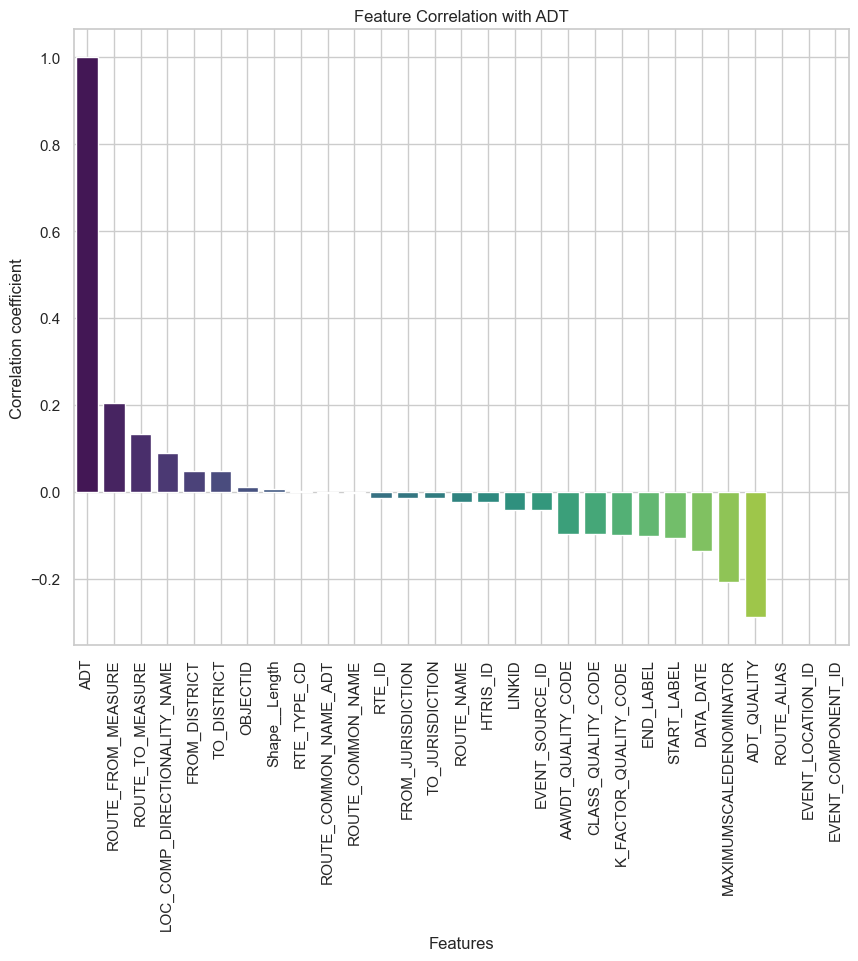

ADT                             1.000000
ROUTE_FROM_MEASURE              0.203303
ROUTE_TO_MEASURE                0.132902
LOC_COMP_DIRECTIONALITY_NAME    0.088847
FROM_DISTRICT                   0.048206
TO_DISTRICT                     0.048143
OBJECTID                        0.011796
Shape__Length                   0.006359
RTE_TYPE_CD                     0.001227
ROUTE_COMMON_NAME_ADT          -0.002887
ROUTE_COMMON_NAME              -0.003533
RTE_ID                         -0.014458
FROM_JURISDICTION              -0.014743
TO_JURISDICTION                -0.014743
ROUTE_NAME                     -0.024184
HTRIS_ID                       -0.024475
LINKID                         -0.042694
EVENT_SOURCE_ID                -0.042694
AAWDT_QUALITY_CODE             -0.097385
CLASS_QUALITY_CODE             -0.098308
K_FACTOR_QUALITY_CODE          -0.098812
END_LABEL                      -0.101912
START_LABEL                    -0.107689
DATA_DATE                      -0.137460
MAXIMUMSCALEDENO

In [21]:
## FEATURE SELECTION

import matplotlib.pyplot as plt
import seaborn as sns

# Calculate the correlation matrix
correlation_matrix = encoded_data.corr()

# Extract correlations with the target variable 'ADT'
adt_correlation = correlation_matrix['ADT'].sort_values(ascending=False)

# Plotting the correlations with ADT
plt.figure(figsize=(10, 8))
sns.barplot(x=adt_correlation.index, y=adt_correlation.values,palette='viridis')
plt.xticks(rotation=90)
plt.title('Feature Correlation with ADT')
plt.xlabel('Features')
plt.ylabel('Correlation coefficient')
plt.grid(True)
plt.show()

adt_correlation


# PREPROCESSING AND MODELLING

                       Model         CV_MSE       CV_Std
0          Linear Regression -107007.857845  1029.571296
1   Random Forest Regression -110144.866091  1389.537086
2         XGBoost Regression -103207.832224  1322.994948
3  Neural Network Regression -113367.221714  3932.017115


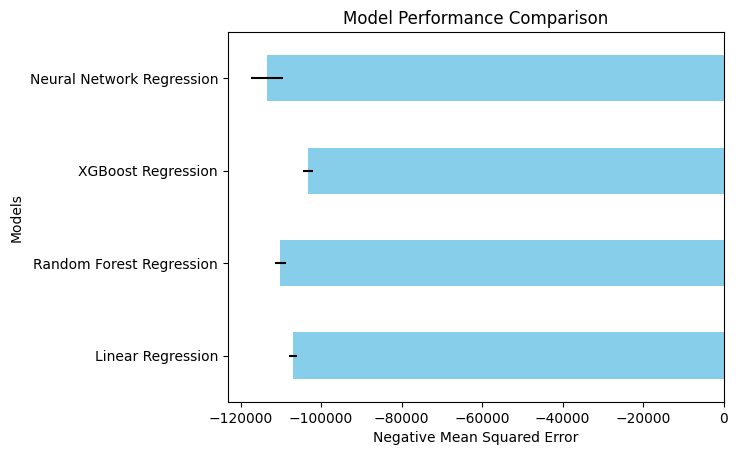

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('./Traffic_Volume_Cleaned.csv')

# Assuming that the necessary preprocessing and encoding have been done
X = data[['ROUTE_FROM_MEASURE', 'ROUTE_TO_MEASURE', 'MAXIMUMSCALEDENOMINATOR']]
y = data['ADT']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest Regression': RandomForestRegressor(n_estimators=100, random_state=42),
    'XGBoost Regression': xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, random_state=42),
    'Neural Network Regression': MLPRegressor(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
}

# Cross-validation setup
cv = KFold(n_splits=3, random_state=42, shuffle=True)

# Function to perform training and evaluation
def train_and_evaluate(models, X, y, cv):
    results = []
    for name, model in models.items():
        cv_scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
        results.append({
            'Model': name,
            'CV_MSE': np.mean(cv_scores),
            'CV_Std': np.std(cv_scores)
        })
    return pd.DataFrame(results)

# Train and evaluate
results_df = train_and_evaluate(models, X_train, y_train, cv)

# Plotting function for model performance
def plot_results(results_df):
    results_df.set_index('Model', inplace=True)
    results_df['CV_MSE'].plot(kind='barh', xerr=results_df['CV_Std'], color='skyblue')
    plt.title('Model Performance Comparison')
    plt.xlabel('Negative Mean Squared Error')
    plt.ylabel('Models')
    plt.show()

# Display and plot results
print(results_df)
plot_results(results_df)



In [2]:
## results_df to csv
results_df.to_csv('model_performance.csv', index=False)


### PRUNING and REGULARIZATION

                       Model         CV_MSE       CV_Std
0          Linear Regression -107007.857845  1029.571296
1   Random Forest Regression  -99795.350398  1058.949133
2         XGBoost Regression -103207.832224  1322.994948
3  Neural Network Regression -109571.107539   985.539116


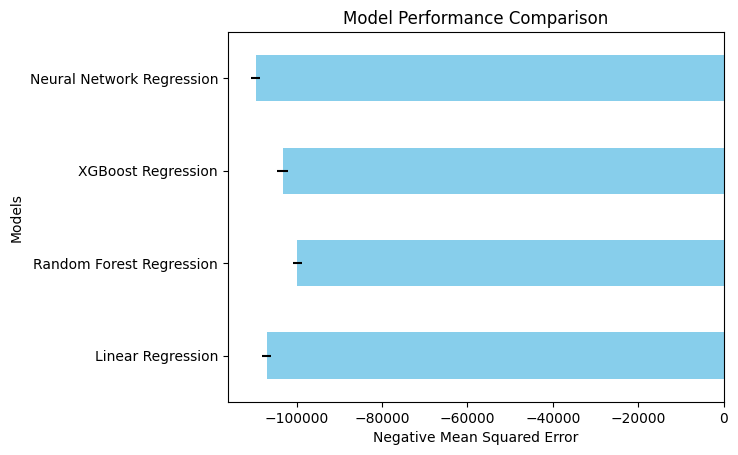

In [4]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import xgboost as xgb
from sklearn.neural_network import MLPRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv('./Traffic_Volume_Cleaned.csv')

# Assuming that the necessary preprocessing and encoding have been done
X = data[['ROUTE_FROM_MEASURE', 'ROUTE_TO_MEASURE', 'MAXIMUMSCALEDENOMINATOR']]
y = data['ADT']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    'Linear Regression': LinearRegression(),
    'Random Forest Regression': RandomForestRegressor(
        n_estimators=100, max_depth=5, min_samples_split=4, min_samples_leaf=2, random_state=42
    ),
    'XGBoost Regression': xgb.XGBRegressor(
        objective='reg:squarederror', n_estimators=100, gamma=0.1, random_state=42
    ),
    'Neural Network Regression': MLPRegressor(
        hidden_layer_sizes=(100,), max_iter=500, alpha=0.001,
        early_stopping=True, random_state=42
    )
}

# Cross-validation setup
cv = KFold(n_splits=3, random_state=42, shuffle=True)

# Function to perform training and evaluation
def train_and_evaluate(models, X, y, cv):
    results = []
    for name, model in models.items():
        cv_scores = cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error')
        results.append({
            'Model': name,
            'CV_MSE': np.mean(cv_scores),
            'CV_Std': np.std(cv_scores)
        })
    return pd.DataFrame(results)

# Train and evaluate
results_df = train_and_evaluate(models, X_train, y_train, cv)

# Plotting function for model performance
def plot_results(results_df):
    results_df.set_index('Model', inplace=True)
    results_df['CV_MSE'].plot(kind='barh', xerr=results_df['CV_Std'], color='skyblue')
    plt.title('Model Performance Comparison')
    plt.xlabel('Negative Mean Squared Error')
    plt.ylabel('Models')
    plt.show()

# Display and plot results
print(results_df)
plot_results(results_df)


In [5]:
## best model
best_model = models['Random Forest Regression'] 
best_model.fit(X_train, y_train)    # Train the best model on the full training set 

# Make predictions on the test set
y_pred = best_model.predict(X_test)

# Calculate evaluation metrics  
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)   

mse, r2, mae


(105151.69513948637, 0.15567028042503128, 202.75450427974852)

In [ ]:
## (105151.69513948637, 0.15567028042503128, 202.75450427974852)
## Interpretation: The Random Forest Regression model achieved a Mean Squared Error (MSE) of approximately 105,151.70,
## R-squared value of 0.16, and Mean Absolute Error (MAE) of approximately 202.75 on the test set.

## Deatiled Interpretation
## The Random Forest Regression model achieved a Mean Squared Error (MSE) of approximately 105,151.70, which indicates the average squared difference between the predicted and actual values. A lower MSE value indicates better performance.
## The R-squared value of 0.16 indicates that the model explains approximately 16% of the variance in the target variable. A higher R-squared value closer to 1 indicates a better fit of the model to the data.
## The Mean Absolute Error (MAE) of approximately 202.75 represents the average absolute difference between the predicted and actual values. A lower MAE value indicates better accuracy of the model predictions.



In [6]:
## load the cleaned dataset again, and use START_LABEL and END_LABEL columns for network analysis, ADT column for prediction
data = pd.read_csv('Traffic_Volume_Cleaned.csv')

import networkx as nx

# Create a directed graph   
G = nx.DiGraph()

# Add edges to the graph from the 'START_LABEL' to 'END_LABEL' columns
G.add_edges_from(data[['START_LABEL', 'END_LABEL']].values) 

# Calculate the PageRank centrality of each node in the graph   
pagerank_centrality = nx.pagerank(G)

# Display the PageRank centrality values of the first few nodes 
pagerank_centrality_list = list(pagerank_centrality.items())[:5]

pagerank_centrality_list


[('34-781 Prince Frederick Dr', 1.031874430949651e-05),
 ('Dead End', 0.07315297615152912),
 ('0.08 ME SR 40 Wickliffe Ave', 1.8423508220635e-05),
 ('15-1144 Riverside Dr', 2.731402020245542e-05),
 ('09-619 Turner Branch Rd', 2.8836422484401867e-05)]

In [ ]:
## use the best model to predict the Average Daily Traffic (ADT) for all unique 'START_LABEL' nodes in the network
# Load the dataset
data = pd.read_csv('Traffic_Volume_Cleaned.csv')

## loop through every column, get the relevant columns,predict on the ADT using the best model, get the START_LABEL, END_LABEL
## create a network graph with START_LABEL, END_LABEL, predicted ADT as weight
# Initialize an empty graph
G = nx.DiGraph()

# Loop through each row in the dataset
for _, row in data.iterrows():
    # Get the relevant columns for prediction
    X = row[['ROUTE_FROM_MEASURE', 'ROUTE_TO_MEASURE', 'MAXIMUMSCALEDENOMINATOR']].values.reshape(1, -1)
    # Predict the ADT using the best model
    predicted_adt = best_model.predict(X)[0]
    # Get the START_LABEL and END_LABEL
    start_label, end_label = row['START_LABEL'], row['END_LABEL']
    # Add the edge to the graph with the predicted ADT as the weight
    G.add_edge(start_label, end_label, weight=predicted_adt)
    
# Display the number of nodes and edges in the graph
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()

num_nodes, num_edges



c:\Users\abhi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\abhi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\abhi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\abhi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\abhi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature 

(46629, 64643)

In [10]:
## keep only the top 10 nodes with the highest PageRank centrality values
# Calculate the PageRank centrality of each node in the graph
pagerank_centrality = nx.pagerank(G)

# Get the top 10 nodes with the highest PageRank centrality values
top_nodes = dict(sorted(pagerank_centrality.items(), key=lambda x: x[1], reverse=True)[:10])

top_nodes

{'Cul-de-Sac': 0.07413683015618706,
 'Dead End': 0.07317019311396247,
 'Dead End; Gap': 0.0012292654131903949,
 'Begin Loop': 0.0010179517267995557,
 'End Loop': 0.0008928178976899379,
 '29-620 Braddock Rd': 0.00043465169016950996,
 '76-1856 Del Mar Dr': 0.0004103689759976401,
 'US 1 Jefferson Davis Hwy': 0.00040834883815334957,
 'End State Maintenance': 0.0003618692128981977,
 'US 11 Lee Highway': 0.000323633555936848}

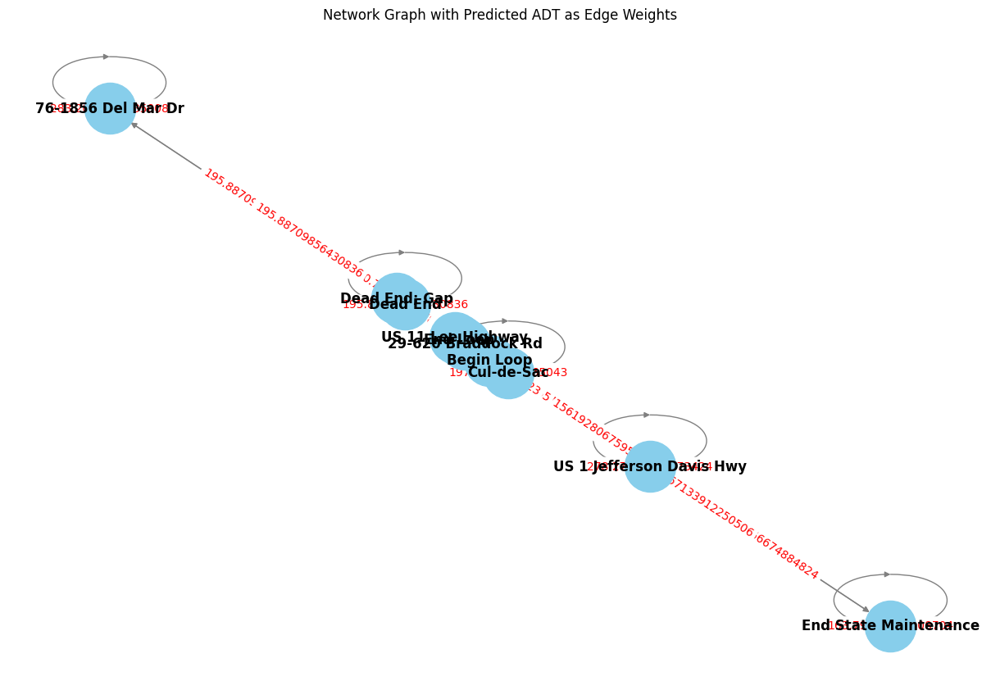

In [18]:
## plot the network graph with the predicted ADT as edge weights
# Set the figure size

G = G.subgraph(top_nodes.keys())  # Keep only the top 10 nodes
plt.figure(figsize=(12, 8))

# Draw the network graph with edge labels for top 10 nodes
pos = nx.spring_layout(G)  # Define the layout
edge_labels = nx.get_edge_attributes(G, 'weight')  # Get the edge weights
nx.draw(G, pos, with_labels=True, node_size=2000, node_color='skyblue', font_size=12, font_weight='bold', edge_color='gray')
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_color='red', font_size=10)  # Add edge labels    
plt.title('Network Graph with Predicted ADT as Edge Weights')
plt.show()
